In [8]:
import argparse, sys, os, errno
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
#import seaborn as sns
import h5py
import os
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
import itertools

Populating the interactive namespace from numpy and matplotlib


/Share/home/chenxupeng/anaconda2/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [6]:
np.math.factorial(10)

3628800

In [7]:
3628800*2**10

3715891200

In [12]:
2**10

1024

In [8]:
50000000*11

550000000

In [10]:
cd /Share/home/chenxupeng/projects/training

/Share/home/chenxupeng/projects/training


In [11]:
#load original counts arr
originalnames = np.array(['lncRNA', 'miRNA', 'mRNA', 'piRNA', 'snoRNA', 'snRNA', 'srpRNA',
       'tRNA', 'vaultRNA', 'Y_RNA', 'tucpRNA'])
rnanames = np.array([ 'miRNA', 
            'Y_RNA', 'piRNA', 'srpRNA', 
            'snoRNA', 'snRNA', 'tRNA','vaultRNA',
            'tucpRNA', 'lncRNA','mRNA' ])
xsorted = np.argsort(originalnames)
ypos = np.searchsorted(originalnames[xsorted], rnanames)
transind  = xsorted[ypos]
wholenum = np.math.factorial(1)*np.math.factorial(3)*np.math.factorial(4)*np.math.factorial(3)

rankin1 = np.array(list(itertools.permutations(np.arange(0,3))))
rankin2 = np.array(list(itertools.permutations(np.arange(0,4))))
rankin3 = np.array(list(itertools.permutations(np.arange(0,3))))
rankind = np.zeros([wholenum,10]).astype('int')
for i in range(6):
    for j in range(24):
        for t in range(6):
            rankind[i*144+j*6+t] =\
            np.concatenate((rankin1[i],rankin2[j],rankin3[t]))


filename = np.loadtxt('filename.txt',dtype='str')[0]  #'17402567-B.all.mx'
samplearrmx_ = np.array(pd.read_table(filename)
                       .iloc[:,1:])[:,transind]

In [15]:
pd.DataFrame(samplearrmx_.astype('int'),columns=rnanames)

,miRNA,Y_RNA,piRNA,srpRNA,snoRNA,snRNA,tRNA,vaultRNA,tucpRNA,lncRNA,mRNA
0,0,0,0,0,1,0,0,0,0,3,0
1,0,2,0,0,0,0,0,0,0,3,3
2,0,1,0,0,0,0,0,0,0,3,4
3,4,0,0,0,0,0,0,0,0,4,0
4,0,2,0,0,0,0,0,0,0,3,3
5,1,0,0,0,0,0,0,0,0,3,0
6,2,0,0,0,0,0,0,0,0,1,1
7,0,1,0,0,0,0,0,0,0,4,3
8,2,0,1,0,0,0,0,0,0,5,0
9,0,2,0,0,0,0,0,0,0,3,3


#### 得到864种排列方式用于调整得到的counts获得统一顺序

In [22]:
def get_rnanameind():
    wholenum = 864
    rankin1 = np.array(list(itertools.permutations(np.arange(1,4))))
    rankin2 = np.array(list(itertools.permutations(np.arange(4,8))))
    rankin3 = np.array(list(itertools.permutations(np.arange(8,11))))
    rankind = np.zeros([wholenum,11]).astype('int')
    for i in range(6):
        for j in range(24):
            for t in range(6):
                rankind[i*144+j*6+t,1:] =\
                np.concatenate((rankin1[i],rankin2[j],rankin3[t]))
    return rankind
transindtest = np.ndarray([864,11]).astype('int')
for i in range(864):
    originalid = get_rnanameind()[i]
    xsorted = np.argsort(originalid)
    ypos = np.searchsorted(originalid[xsorted], np.arange(0,11))
    transindtest[i] = xsorted[ypos]

In [5]:
get_rnanameind()

array([[ 0,  1,  2, ...,  8,  9, 10],
       [ 0,  1,  2, ...,  8, 10,  9],
       [ 0,  1,  2, ...,  9,  8, 10],
       ...,
       [ 0,  3,  2, ...,  9, 10,  8],
       [ 0,  3,  2, ..., 10,  8,  9],
       [ 0,  3,  2, ..., 10,  9,  8]])

#### get sample

In [18]:
filenames = np.loadtxt('02.matrix/filename.txt',dtype='str')

In [14]:
filenames = np.loadtxt('02.matrix/filename.txt',dtype='str')
samplenum = 61
wholesamplearr = np.ndarray([samplenum,864,11]).astype('int')
for i in tqdm(range(samplenum)):
    with h5py.File('02.matrix/new/counts/5.25/'+filenames[i]) as f:
        #print filenames[i]
        wholesamplearr[i] = f['counts'][:]

100%|██████████| 61/61 [00:02<00:00, 28.05it/s]


In [42]:
wholesamplearr.shape

(61, 864, 11)

#### 调换成统一的列名

In [43]:
wholesamplearr[:,i,get_rnanameind()[i]].shape

(61, 11)

In [66]:
get_rnanameind()

array([[ 0,  1,  2, ...,  8,  9, 10],
       [ 0,  1,  2, ...,  8, 10,  9],
       [ 0,  1,  2, ...,  9,  8, 10],
       ...,
       [ 0,  3,  2, ...,  9, 10,  8],
       [ 0,  3,  2, ..., 10,  8,  9],
       [ 0,  3,  2, ..., 10,  9,  8]])

#### 获得864种情况每个情况11种RNA的平均counts，并存储

In [67]:
average_counts_allrank = np.zeros([864,11])
for i in range(864):
    average_counts_allrank[i] = np.average(wholesamplearr[:,i,get_rnanameind()[i]],axis=0)

In [59]:
average_counts_allrank.shape

(864, 11)

In [23]:
average_counts_allrank = np.zeros([864,11])
for i in range(864):
    average_counts_allrank[i] = np.average(wholesamplearr[:,i,transindtest[i]],axis=0)

In [24]:
np.unique(average_counts_allrank[:,1],return_counts=True)

(array([15098983.27868852, 15098983.80327869, 15144375.03278689,
        15144375.60655738]), array([288, 144, 144, 288]))

In [25]:
np.unique(average_counts_allrank[:,1:4],axis=0)

array([[1.50989833e+07, 5.81025787e+05, 1.12569344e+04],
       [1.50989833e+07, 5.81664754e+05, 1.06179672e+04],
       [1.50989838e+07, 5.81664754e+05, 1.06174426e+04],
       [1.51443750e+07, 5.35634033e+05, 1.12569344e+04],
       [1.51443756e+07, 5.35634033e+05, 1.12563607e+04],
       [1.51443756e+07, 5.36272951e+05, 1.06174426e+04]])

In [39]:
average_counts_allrank = np.loadtxt('average_counts_allrank')

In [39]:
np.savetxt('average_counts_allrank',average_counts_allrank)

In [46]:
np.unique(np.sum(average_counts_allrank,axis=1))

array([37133306.31147541, 37133306.31147542])

#### 864种情况的11种rna的平均值的总和一样

In [313]:
np.unique(np.sum(average_counts_allrank,axis=1))

array([37133306.31147541, 37133306.31147542])

#### 每个样本的864种情况的11种rna的总和一样

In [314]:
np.unique(np.sum(wholesamplearr[0],axis=1))

array([37778915])

In [16]:
np.sum(wholesamplearr[0,0])

37778915

In [17]:
readscounts = np.ndarray([61])
for i in range(61):
    readscounts[i] = np.sum(wholesamplearr[i,0])

array([37778915., 49851642., 36357662., 34038682., 36969910., 22815419.,
       29459042., 30367211., 41701910., 23300401., 34540477., 49399880.,
       52810867., 24608541., 58897215., 39940787., 47985618., 33978733.,
       74624245., 12796059., 35384640., 40920507., 37546442., 34516705.,
       49733969., 32222982., 38419473., 36653575., 32396973., 30068133.,
       26989265., 27889693., 38037606., 34075605., 31102336., 20654031.,
       22811768.,  3140745., 31470194., 35823601., 38713905., 42486910.,
       39528181., 44132639., 27730959., 45715125., 38679163., 20414862.,
       19465946., 41538025., 42114502., 41082820., 46244280., 39448275.,
       52245180., 46906922., 47391656., 45704190., 41589558., 46086129.,
       45830999.])

In [24]:
np.savetxt('trim50counts.txt',np.concatenate((readscounts.reshape(-1,1),np.array(othertable['clean_reads']).reshape(-1,1)),axis=1))

In [19]:
othertable = pd.read_table('/Share/home/caojingyi/exRNA/process/16.one_map/03.tmp/all_num')

In [27]:
othertable.head()

,sample,clean_reads,rRNA,hg38(no_rRNA)
0,10515058-A,44369560,2652129,39193976
1,12402567-A,61339043,1189562,50443256
2,13515292-A,44722389,363451,37746626
3,17402567-B,46906234,965861,35146222
4,249136-B,57261930,4248383,36598642


In [33]:
virus+fungi+bacteria

array([4179737.45901639])

In [34]:
rRNAcounts= np.average(othertable['rRNA']).astype('int')
hg38counts = np.average(othertable['hg38(no_rRNA)']).astype('int')
clean_reads = np.average(othertable['clean_reads']).astype('int')

otherregion = hg38counts - np.sum(average_counts_allrank[0])
virus =np.array([ 74807.24590164])
fungi   =np.array([3828285.59016393])
bacteria=np.array([276644.62295082])
nonhuman = clean_reads  - hg38counts - rRNAcounts - (virus+fungi+bacteria)

In [35]:
rnanames = np.array([ 'miRNA', 
            'Y_RNA', 'piRNA', 'srpRNA', 
            'snoRNA', 'snRNA', 'tRNA','vaultRNA',
            'tucpRNA', 'lncRNA','mRNA',
            'rRNA','hg38','nonhuman','other-region','clean-reads',
                    'virus','fungi','bacteria'])

In [36]:
wholearr = np.concatenate((average_counts_allrank,np.repeat(rRNAcounts,864).reshape(-1,1),
                np.repeat(hg38counts,864).reshape(-1,1),np.repeat(nonhuman,864).reshape(-1,1),
                np.repeat(otherregion,864).reshape(-1,1),np.repeat(clean_reads,864).reshape(-1,1)
                 ,np.repeat(virus ,864).reshape(-1,1),np.repeat(fungi,864).reshape(-1,1)
                          ,np.repeat(bacteria,864).reshape(-1,1)),axis=1).astype('int')

In [63]:
pd.DataFrame(wholearr,columns=rnanames).head()

,miRNA,Y_RNA,piRNA,srpRNA,snoRNA,snRNA,tRNA,vaultRNA,tucpRNA,lncRNA,mRNA,rRNA,hg38,nonhuman,other-region,clean-reads,virus,fungi,bacteria
0,17545369,15144375,536272,10617,804809,31081,200719,5236,389946,2358811,106065,1199623,37691616,6217821,558309,45109060,74807,3828285,276644
1,17545369,15144375,536272,10617,804809,31081,200719,5236,389946,2066703,398173,1199623,37691616,6217821,558309,45109060,74807,3828285,276644
2,17545369,15144375,536272,10617,804809,31081,200719,5236,5908,2742849,106065,1199623,37691616,6217821,558309,45109060,74807,3828285,276644
3,17545369,15144375,536272,10617,804809,31081,200719,5236,107072,4901,2742849,1199623,37691616,6217821,558309,45109060,74807,3828285,276644
4,17545369,15144375,536272,10617,804809,31081,200719,5236,2066703,416888,371230,1199623,37691616,6217821,558309,45109060,74807,3828285,276644


In [37]:
includeind = np.concatenate((np.arange(0,12),np.array([13,14,16,17,18])))
rnanames[includeind]

array(['miRNA', 'Y_RNA', 'piRNA', 'srpRNA', 'snoRNA', 'snRNA', 'tRNA',
       'vaultRNA', 'tucpRNA', 'lncRNA', 'mRNA', 'rRNA', 'nonhuman',
       'other-region', 'virus', 'fungi', 'bacteria'], dtype='|S12')

datattt =(wholearr[:,includeind]/float(np.sum(wholearr[:,includeind],axis=1)[0]))[np.arange(1,4)]
N = datattt.shape[0]
plt.figure(figsize=(20,10))
ind = np.arange(N)
p={}
p[0] = plt.bar(ind,datattt[:,0],width)
countarr = datattt[:,0]
for i in np.arange(1,datattt.shape[1]):
    p[i] = plt.bar(ind,datattt[:,i],width,bottom=countarr)
    countarr+=datattt[:,i]
plt.legend(([p[i] for i in range(datattt.shape[1])]), (rnanames[includeind]))

In [55]:
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),  
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),  
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),  
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),  
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)] 

In [327]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')
def plot_bar(width,index):
    '''
    data: sample*allrna  每行是所有样本  每列是一种rna
    '''
    data = (wholearr[:,includeind]/float(np.sum(wholearr[:,includeind],axis=1)[0]))[index]
    N = data.shape[0]
    ind = np.arange(N) 
    plt.figure(figsize=(20,10))
    p={}
    p[0] = plt.bar(ind,data[:,0],width,color = np.array(tableau20)[0]/float(256))
    countarr = data[:,0]
    for i in np.arange(1,data.shape[1]):
        p[i] = plt.bar(ind,data[:,i],width,bottom=countarr,color=np.array(tableau20)[i]/float(256))
        countarr+=data[:,i]
    plt.ylabel('Ratio')
    plt.title('Ratio bar for some order')
    plt.xticks(ind, index)
    plt.yticks(np.arange(0, 1))
    plt.legend(([p[i] for i in range(data.shape[1])]), (rnanames))
    return data,p

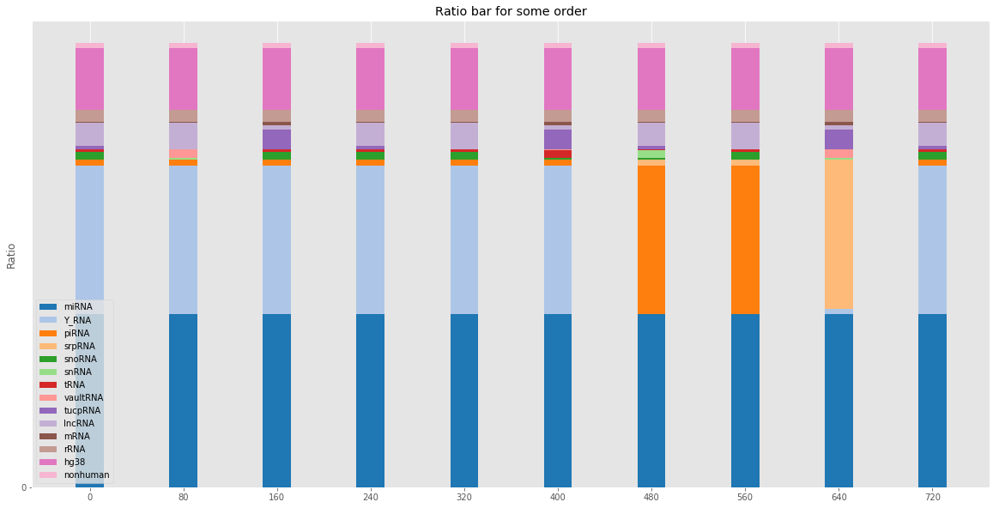

In [328]:
datatt,ptt = plot_bar(0.3,np.arange(0,800,80))

In [38]:
ratiodata = np.array(wholearr[:,includeind]/float(np.sum(wholearr[:,includeind],axis=1)[0]))

In [39]:
ratiodata

array([[0.38895451, 0.33572808, 0.01188835, ..., 0.00165836, 0.08486734,
        0.00613278],
       [0.38895451, 0.33572808, 0.01188835, ..., 0.00165836, 0.08486734,
        0.00613278],
       [0.38895451, 0.33572808, 0.01188835, ..., 0.00165836, 0.08486734,
        0.00613278],
       ...,
       [0.38895451, 0.33472181, 0.01288045, ..., 0.00165836, 0.08486734,
        0.00613278],
       [0.38895451, 0.33472181, 0.01288045, ..., 0.00165836, 0.08486734,
        0.00613278],
       [0.38895451, 0.33472181, 0.01288045, ..., 0.00165836, 0.08486734,
        0.00613278]])

In [40]:
np.savetxt('allratiodata.txt',ratiodata)

#### criteria
miRNA 40+-10
Y_RNA  20-30
piRNA  2+-3
lncRNA  10

In [148]:
wholearr

array([[17545369,   419101,   570032, ...,  6217821,   558309, 45109060],
       [17545369,   419101,   570032, ...,  6217821,   558309, 45109060],
       [17545369,   419101,   570032, ...,  6217821,   558309, 45109060],
       ...,
       [17545369,   406249,   581025, ...,  6217821,   558309, 45109060],
       [17545369,   406249,   581025, ...,  6217821,   558309, 45109060],
       [17545369,   406249,   581025, ...,  6217821,   558309, 45109060]])

In [156]:
includeind

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 13, 14])

In [159]:
(wholearr[:,includeind]/float(np.sum(wholearr[:,includeind],axis=1)[0]))[np.arange(0,800,80)]

array([[3.88954479e-01, 9.29083972e-03, 1.26367533e-02, 2.08339545e-04,
        1.77745909e-02, 6.76383045e-04, 4.32496314e-03, 3.34564513e-01,
        1.16074256e-04, 5.22912972e-02, 2.35130175e-03, 2.65938402e-02,
        1.37839753e-01, 1.23768720e-02],
       [3.88954479e-01, 9.29083972e-03, 1.26367533e-02, 2.08339545e-04,
        3.34564646e-01, 4.32498531e-03, 6.76227866e-04, 1.77745688e-02,
        0.00000000e+00, 5.24073936e-02, 2.35130175e-03, 2.65938402e-02,
        1.37839753e-01, 1.23768720e-02],
       [3.88954479e-01, 9.29083972e-03, 1.26256691e-02, 2.19423794e-04,
        1.77745909e-02, 6.76360877e-04, 4.32498531e-03, 3.34564513e-01,
        4.58157015e-02, 8.82689739e-03, 1.16074256e-04, 2.65938402e-02,
        1.37839753e-01, 1.23768720e-02],
       [3.88954479e-01, 9.29083972e-03, 1.26256691e-02, 2.19423794e-04,
        1.77744579e-02, 6.76227866e-04, 4.32498531e-03, 3.34564756e-01,
        1.16074256e-04, 5.22912972e-02, 2.35130175e-03, 2.65938402e-02,
        1.378

In [160]:
datatt

array([[1.00000000e+00, 9.29083972e-03, 1.26367533e-02, 2.08339545e-04,
        1.77745909e-02, 6.76383045e-04, 4.32496314e-03, 3.34564513e-01,
        1.16074256e-04, 5.22912972e-02, 2.35130175e-03, 2.65938402e-02,
        1.37839753e-01, 1.23768720e-02],
       [1.00000000e+00, 9.29083972e-03, 1.26367533e-02, 2.08339545e-04,
        3.34564646e-01, 4.32498531e-03, 6.76227866e-04, 1.77745688e-02,
        0.00000000e+00, 5.24073936e-02, 2.35130175e-03, 2.65938402e-02,
        1.37839753e-01, 1.23768720e-02],
       [1.00000000e+00, 9.29083972e-03, 1.26256691e-02, 2.19423794e-04,
        1.77745909e-02, 6.76360877e-04, 4.32498531e-03, 3.34564513e-01,
        4.58157015e-02, 8.82689739e-03, 1.16074256e-04, 2.65938402e-02,
        1.37839753e-01, 1.23768720e-02],
       [9.99999978e-01, 9.29083972e-03, 1.26256691e-02, 2.19423794e-04,
        1.77744579e-02, 6.76227866e-04, 4.32498531e-03, 3.34564756e-01,
        1.16074256e-04, 5.22912972e-02, 2.35130175e-03, 2.65938402e-02,
        1.378

#### 检测行数不等的问题

In [73]:
filenams = np.loadtxt('filename.txt',dtype='str')

In [86]:
import numba

In [87]:
@numba.jit
def get_shape(ind):
    return pd.read_table(filenams[ind]).shape[0]

In [ ]:
shapesample = {}
for i in tqdm(range(61)):
    shapesample[i]= get_shape(i)

In [78]:
np.array(othertable['clean_reads']).ravel()

array([44369560, 61339043, 44722389, 46906234, 57261930, 36966418,
       48256006, 36511735, 52477944, 35262529, 44667841, 58518114,
       65901274, 28713031, 69713812, 46530565, 59558226, 41328975,
       84397409, 18406417, 39549361, 53979018, 44556911, 39448644,
       56691843, 37428784, 47265157, 43677009, 37661049, 38367800,
       38039139, 32428931, 49456530, 40999911, 34162964, 25446043,
       43985959, 25731506, 35554902, 39529828, 46980587, 45332569,
       42563738, 48493598, 31081743, 58941571, 43797407, 25269807,
       30952985, 43945070, 44118985, 45212188, 53418875, 42268292,
       56717060, 50255761, 61836300, 50384906, 45701312, 49260942,
       49348224])

In [ ]:
np.array([shapesample[i] for i in range(61)])

In [92]:
mycounts

array([ 63933339,  64374663,  55787417,  46591884,  57406275,  37365264,
        38567695,  53177330,  65784610,  39741755,  51916261,  72388006,
        67832874,  34633117,  88537935,  67458583,  69795514,  54275114,
       115383283,  18833514,  54018649,  64695520,  63693544,  58309769,
        85324655,  57586772,  67260587,  67899638,  49601490,  49938741,
        45312642,  43718874,  50104991,  56804254,  49085182,  27316607,
        30606668,   7015318,  51587518,  54080241,  58137576,  67143826,
        66405014,  74696733,  47590684,  59231138,  46800615,  30216208,
        29000957,  69988820,  72367724,  67623934,  75777845,  66462639,
        87761919,  77170738,  61301712,  70882142,  68029419,  79059001,
        76367569])

In [98]:
testtable = pd.read_table(filenams[0])
testtab = testtable.iloc[1:,1:-1]
arrtest = np.array(testtab)

In [100]:
print (testtable.shape)  #63933339

(37778915, 13)


In [112]:
wholesamplearr[0][0]

array([13849720, 23319999,   601458,     7738,  5045772,    78623,
         237947, 17498804,    58750,  3157167,    77361])

In [120]:
np.where(arrtest[:,0]!=0)[0].shape

(33580889,)

In [123]:
np.where(arrtest[:,0]!=0)[0]

array([       0,        1,        2, ..., 37778911, 37778912, 37778913])

In [121]:
np.where(arrtest[:,0]==0)[0].shape

(4198025,)

In [124]:
testtable = pd.read_table(filenams[10])
testtab = testtable.iloc[1:,1:-1]
arrtest = np.array(testtab)

In [125]:
print (testtable.shape) 

(34540477, 13)


In [132]:
wholesamplearr[10][0]

array([20678655, 13546708,   308198,     6916,  4949101,    31516,
          91123,  8110798,    56856,  4045064,    91326])

In [127]:
np.where(arrtest[:,0]!=0)[0].shape

(31985751,)

In [133]:
np.where(arrtest[:,0]==0)[0].shape

(2554725,)

In [134]:
testtable = pd.read_table(filenams[3])
testtab = testtable.iloc[1:,1:-1]
arrtest = np.array(testtab)
print filenams[3]

/Share/home/caojingyi/exRNA/process/16.one_map/02.matrix/17402567-B.all.mx


In [146]:
arrtest = np.array(testtab)[:,transind]

In [147]:
print (testtable.shape) 

(34038682, 13)


In [148]:
wholesamplearr[3][0]

array([22826185, 10923000,   282139,     7358,  2146079,    19600,
         187428,  8170120,    17117,  1987129,    25729])

In [149]:
np.where(arrtest[:,0]!=0)[0].shape

(22826184,)

In [150]:
mirnacountafter = np.where(arrtest[:,0]==0)  #filter after mirna
mirnacount = arrtest.shape[0] - mirnacountafter[0].shape[0]

In [151]:
print mirnacount

22826184


In [153]:
np.where(arrtest[mirnacountafter,1]!=0)[0].shape[0]

399773

In [175]:
group1needarr = arrtest[mirnacountafter[0]][:,1:4]
group1countafter = np.where(np.sum(group1needarr,axis=1)==0)
group1needind = np.where(np.sum(group1needarr,axis=1)!=0)
group1needarr = group1needarr[group1needind]

In [182]:
group1countafter[0]

array([       0,        1,        2, ..., 11212494, 11212495, 11212496])

In [185]:
group2needarr = arrtest[mirnacountafter[0]][group1countafter][:,4:8]
group2countafter = np.where(np.sum(group2needarr,axis=1)==0)
group2needind = np.where(np.sum(group2needarr,axis=1)!=0)
group2needarr = group2needarr[group2needind]

In [186]:
group2countafter

(array([       1,        4,        5, ..., 10523212, 10523225, 10523226]),)

In [195]:
group3needarr = arrtest[mirnacountafter[0]][group1countafter][group2countafter][:,8:11]
group3countafter = np.where(np.sum(group3needarr,axis=1)==0)
group3needind = np.where(np.sum(group3needarr,axis=1)!=0)
group3needarr = group3needarr[group3needind]

In [196]:
group3countafter[0].shape

(0,)

In [177]:
np.where(np.sum(group1needarr,axis=1)!=0)[0].shape[0]

689270

In [176]:
group1needarr.shape

(689270, 3)

In [180]:
np.unique((group1needarr != 0).argmax(axis=1),return_counts=True)

(array([0, 1, 2]), array([399773, 282139,   7358]))

In [179]:
group1needarr

array([[1, 0, 0],
       [2, 0, 0],
       [0, 4, 0],
       ...,
       [0, 4, 0],
       [1, 0, 0],
       [0, 3, 0]])

In [158]:
group1countafter[0].shape

(10523227,)

In [160]:
group2needarr = arrtest[mirnacountafter[0]][group1countafter][:,4:8]
group2countafter = np.where(np.sum(group2needarr,axis=1)==0)

In [161]:
group2countafter[0].shape

(2029975,)

In [162]:
group2countafter[0]

array([       1,        4,        5, ..., 10523212, 10523225, 10523226])

In [163]:
group3needarr = arrtest[mirnacountafter[0]][group2countafter][:,8:]

In [164]:
group3needarr.shape[0]

2029975

In [165]:
22826184  + 10523227

33349411

In [144]:
originalnames = np.array(['lncRNA', 'miRNA', 'mRNA', 'piRNA', 'snoRNA', 'snRNA', 'srpRNA',
       'tRNA', 'tucpRNA', 'vaultRNA', 'Y_RNA'])
rnanames = np.array([ 'miRNA', 
            'Y_RNA', 'piRNA', 'srpRNA', 
            'snoRNA', 'snRNA', 'tRNA','vaultRNA',
            'tucpRNA', 'lncRNA','mRNA' ])
xsorted = np.argsort(originalnames)
ypos = np.searchsorted(originalnames[xsorted], rnanames)
transind  = xsorted[ypos]

In [226]:
transind

array([ 0,  2, 10,  4,  7,  5,  6,  8,  9, 11,  1,  3])

### reads length

In [34]:
originalnames = np.array(['length','lncRNA', 'miRNA', 'mRNA', 'piRNA', 'snoRNA', 'snRNA', 'srpRNA',
       'tRNA', 'vaultRNA', 'Y_RNA', 'tucpRNA'])
rnanames = np.array(['length', 'miRNA', 
            'Y_RNA', 'piRNA', 'srpRNA', 
            'snoRNA', 'snRNA', 'tRNA','vaultRNA',
            'tucpRNA', 'lncRNA','mRNA' ])
xsorted = np.argsort(originalnames)
ypos = np.searchsorted(originalnames[xsorted], rnanames)
transind =  xsorted[ypos]
wholenum = np.math.factorial(1)*np.math.factorial(3)*np.math.factorial(4)*np.math.factorial(3)

In [17]:
rankin1 = np.array(list(itertools.permutations(np.arange(0,3))))
rankin2 = np.array(list(itertools.permutations(np.arange(0,4))))
rankin3 = np.array(list(itertools.permutations(np.arange(0,3))))
rankind = np.zeros([wholenum,10]).astype('int')
for i in range(6):
    for j in range(24):
        for t in range(6):
            rankind[i*144+j*6+t] =\
            np.concatenate((rankin1[i],rankin2[j],rankin3[t]))

In [18]:
lengthind = np.array([16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26., 27., 28.,
       29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39., 40., 41.,
       42., 43., 44., 45., 46., 47., 48.,49., 50.]).astype('int')

In [41]:
filename = np.loadtxt('lengthfilename.txt'
                      ,dtype='str')[0]  #'17402567-B.all.mx'
samplearrmx = np.array(pd.read_table(filename)
                       .iloc[:,:])[:,transind]

In [44]:
testarr = samplearrmx[:,2:5]

In [48]:
print np.where(testarr[:,0]!=0)[0].shape[0]
print np.where(testarr[:,1]!=0)[0].shape[0]
print np.where(testarr[:,2]!=0)[0].shape[0]

19203096
80038
964306


In [52]:
print np.where((testarr[:,0]!=0) &(testarr[:,1]!=0))[0].shape[0]
print np.where((testarr[:,0]!=0) &(testarr[:,2]!=0))[0].shape[0]
print np.where((testarr[:,1]!=0) &(testarr[:,2]!=0))[0].shape[0]

36603
200000
1


In [31]:
filename

'/Share/home/caojingyi/exRNA/process/16.one_map/02.hg38/10515058-A.hg38.length.mx'

In [41]:
from scipy.stats import pearsonr

In [43]:
pearsonr(samplearrmx_.ravel(),samplearrmx[:,1:].ravel())

(1.0, 0.0)

In [45]:
np.sum(samplearrmx_ - samplearrmx[:,1:])

0.0

In [38]:
samplearrmx_.shape

(37778915, 11)

In [39]:
samplearrmx.shape

(37778915, 12)

In [31]:
#每种情况的都存在这里，最终要存864个 *11*35

In [129]:
np.unique(samplearrmx[:,0])

array([16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26., 27., 28.,
       29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39., 40., 41.,
       42., 43., 44., 45., 46., 47., 48., 49., 50.])

In [132]:
np.in1d(np.arange(16,51),np.arange(20,30))

array([False, False, False, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False])

In [133]:
np.arange(0,35)[np.in1d(np.arange(16,51),np.arange(20,30))]

array([ 4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

In [16]:
np.unique(samplearrmx[:,1])

array([0., 1., 2., 3., 4., 5., 6., 7., 8.])

##### miRNA

In [33]:
#在所有样本中都一样，所以算一次就好了
#注意顺序！  np.in1d(lengthind,countind1) 
start = time.clock()
mirnacountafter = np.where(samplearrmx[:,1]==0) 
mirnacountneed = np.where(samplearrmx[:,1]!=0) 
countind1,counts1 =np.unique(samplearrmx[mirnacountneed,0],return_counts=True)
countind1 = countind1.astype('int')
positionind = np.where(np.in1d(lengthind,countind1))
mirnalength= np.zeros([35])
mirnalength[positionind] = counts1
#[  11282,   31174,  120826,  212251,  822086, 4846540, 5384869,
#1852706,  467052,   48340,   12024,    2987,    1178,     578,
#273,     252,     164,     145,     151,     225,     253,
#263,     156,     117,    1214,    2803,    3527,    1754,
#1004,    1857,     862,     414,  0,  1980,   18413]

In [38]:
#和counts一样，先group1 2 3产生
#注意，这次group1从2开始！！!!!
group1needarr = samplearrmx[mirnacountafter[0]][:,2:5]
group1countafter = np.where(np.sum(group1needarr,axis=1)==0)
group1needind = np.where(np.sum(group1needarr,axis=1)!=0)
group1needarr = group1needarr[group1needind]

group2needarr = samplearrmx[mirnacountafter[0]][group1countafter][:,5:9]
group2countafter = np.where(np.sum(group2needarr,axis=1)==0)
group2needind = np.where(np.sum(group2needarr,axis=1)!=0)
group2needarr = group2needarr[group2needind]

group3needarr = samplearrmx[mirnacountafter[0]][group1countafter][group2countafter][:,9:12]
group3needind = np.where(np.sum(group3needarr,axis=1)!=0)
group3needarr = group3needarr[group3needind]

In [39]:
def get_single_column_length(groupneedind,groupneedarr,i,rank):
    '''
    i: group内第几列  rank rankin1[i]
    '''
    groupcol = (groupneedarr[:,rank] !=0).argmax(axis=1)
    groupcountind = np.unique(samplearrmx[:,0][groupneedind[0]][np.where(groupcol ==i)],return_counts=True)
    groupcountind_ = groupcountind[0].astype('int')
    positionind = np.where(np.in1d(lengthind,groupcountind_))[0]
    returnlength = np.zeros([35])
    returnlength[positionind] = groupcountind[1]
    return returnlength

In [45]:
get_single_column_length(group1needind,0,rankin1[i])

array([   818.,   1116.,   3110.,   4457.,  15445.,  81866.,  98545.,
        32468.,   8565.,   1708.,   2947.,   3149.,   3017.,   4977.,
         4562.,  90775., 171301.,  11234.,   1750.,   1148.,   1853.,
         1487.,    704.,    606.,    769.,    640.,    523.,    770.,
          854.,    687.,    422.,   1632.,    520.,  60292.,      0.])

In [35]:
group1countind1[1]

array([   818,   1116,   3110,   4457,  15445,  81866,  98545,  32468,
         8565,   1708,   2947,   3149,   3017,   4977,   4562,  90775,
       171301,  11234,   1750,   1148,   1853,   1487,    704,    606,
          769,    640,    523,    770,    854,    687,    422,   1632,
          520,  60292])

####  总结结果
每种order 每个rna都有一行16-50的length统计，总计每种order 11*35<br>
每个样本共 864* 11 *35 <br>
所有61 *864 *11 *35 每种境况最后算一个11 *35的结果

In [65]:
group1countlength1 = get_single_column_length(group1needind,group1needarr,0,rankin1[i])
group1countlength2 = get_single_column_length(group1needind,group1needarr,1,rankin1[i])
group1countlength3 = get_single_column_length(group1needind,group1needarr,2,rankin1[i])

group1length = np.concatenate((group1countlength1,group1countlength2
                               ,group1countlength3)).reshape(3,-1)
group2countlength1 = get_single_column_length(group2needind,group2needarr,0,rankin2[i])
group2countlength2 = get_single_column_length(group2needind,group2needarr,1,rankin2[i])
group2countlength3 = get_single_column_length(group2needind,group2needarr,2,rankin2[i])
group2countlength4 = get_single_column_length(group2needind,group2needarr,3,rankin2[i])
group3countlength1 = get_single_column_length(group3needind,group3needarr,0,rankin3[i])
group3countlength2 = get_single_column_length(group3needind,group3needarr,1,rankin3[i])
group3countlength3 = get_single_column_length(group3needind,group3needarr,2,rankin3[i])


In [41]:
group1lengtharr = np.zeros([group1needind[0].shape[0],3])
group1lengtharr[:,group1col] = samplearrmx[:,0][group1needind[0]]

每个块儿分别有 6 24 6种结果  
每个rna每次都是35个值的矩阵

In [40]:
print (group1needarr.shape,group2needarr.shape,group3needarr.shape)

counts1 = np.ndarray([6,3,35]).astype('int')
for i in range(6):
    group1countlength1 = get_single_column_length(group1needind,group1needarr,0,rankin1[i])
    group1countlength2 = get_single_column_length(group1needind,group1needarr,1,rankin1[i])
    group1countlength3 = get_single_column_length(group1needind,group1needarr,2,rankin1[i])
    counts1[i] = np.concatenate((group1countlength1,group1countlength2
                               ,group1countlength3)).reshape(3,-1)

counts2 = np.ndarray([24,4,35]).astype('int')
for i in range(24):
    group2countlength1 = get_single_column_length(group2needind,group2needarr,0,rankin2[i])
    group2countlength2 = get_single_column_length(group2needind,group2needarr,1,rankin2[i])
    group2countlength3 = get_single_column_length(group2needind,group2needarr,2,rankin2[i])
    group2countlength4 = get_single_column_length(group2needind,group2needarr,3,rankin2[i])
    counts2[i] = np.concatenate((group2countlength1,group2countlength2
                               ,group2countlength3,group2countlength4)).reshape(4,-1)
counts3 = np.ndarray([6,3,35]).astype('int')
for i in range(6):
    group3countlength1 = get_single_column_length(group3needind,group3needarr,0,rankin3[i])
    group3countlength2 = get_single_column_length(group3needind,group3needarr,1,rankin3[i])
    group3countlength3 = get_single_column_length(group3needind,group3needarr,2,rankin3[i])
    counts3[i] = np.concatenate((group3countlength1,group3countlength2
                               ,group3countlength3)).reshape(3,-1)


((8436922, 3), (891814, 4), (4533086, 3))


In [81]:
wholecounts = np.zeros([864,11,35]).astype('int')

for i in range(6):
    for j in range(24):
        for t in range(6):
            wholecounts[i*144+j*6+t] =\
            np.concatenate((mirnalength.reshape(1,-1),counts1[i],counts2[j],counts3[t]),axis=0)



In [73]:
wholecounts.shape

(864, 11, 35)

In [80]:
get_rnanameind()[i].shape

(11,)

In [84]:
adjustarr = np.zeros([864,11,35])
for i in range(864):
    adjustarr[i] = wholecounts[i,get_rnanameind()[i]]

In [85]:
adjustarr.shape

(864, 11, 35)

In [159]:
elapsed = (time.clock() - start)
print("Time used:",elapsed)

('Time used:', 40.53000000000003)


In [151]:
wholecounts.shape

(864, 11, 35)

### 读取length各个样本结果 
61* 864* 11* 35

In [16]:
def get_rnanameind():
    wholenum = 864
    rankin1 = np.array(list(itertools.permutations(np.arange(1,4))))
    rankin2 = np.array(list(itertools.permutations(np.arange(4,8))))
    rankin3 = np.array(list(itertools.permutations(np.arange(8,11))))
    rankind = np.zeros([wholenum,11]).astype('int')
    for i in range(6):
        for j in range(24):
            for t in range(6):
                rankind[i*144+j*6+t,1:] =\
                np.concatenate((rankin1[i],rankin2[j],rankin3[t]))
    return rankind

In [182]:
filenames = np.loadtxt('02.matrix/new/length/adjust/lengthfile.txt',dtype='str')
samplenum = 61
wholesamplelengtharr = np.ndarray([samplenum,864,11,35]).astype('int')
for i in range(samplenum):
    with h5py.File('02.matrix/new/length/adjust2/'+filenames[i]) as f:
        #print filenames[i]
        wholesamplelengtharr[i] = f['counts'][:]

In [184]:
average_length_allrank = np.zeros([864,11,35])
for i in range(864):
    average_length_allrank[i] = np.average(wholesamplelengtharr[:,i,:,:],axis=0)
with h5py.File('wholelength2') as f:
    f.create_dataset('data',data=average_length_allrank)

In [47]:
tttarr = np.array(pd.read_table('/Share/home/caojingyi/exRNA/process/16.one_map/02.hg38/10515058-A.hg38.summary',names=['0','1']))

In [38]:
np.sum(wholesamplelengtharr[0,0])

37778915

In [ ]:
rnanames = np.array(['length', 'miRNA', 
            'Y_RNA', 'piRNA', 'srpRNA', 
            'snoRNA', 'snRNA', 'tRNA','vaultRNA',
            'tucpRNA', 'lncRNA','mRNA' ])
originalnames = np.array(['length','lncRNA', 'miRNA', 'mRNA', 'piRNA', 'snoRNA', 'snRNA', 'srpRNA',
       'tRNA', 'vaultRNA', 'Y_RNA', 'tucpRNA'])

In [123]:
wholesamplelengtharr[0,0].shape
np.sum(wholesamplelengtharr[0,0],axis=0)

array([  42574,   73661,  241219,  383963, 1417575, 8041916, 9239564,
       3116767,  799438,  115184,  125415,  128237,  117728,  194748,
        180037, 3541185, 6635681,  440405,   67302,   43281,   70740,
         58583,   28493,   24900,   30442,   27418,   22902,   31367,
         33773,   28208,   15103,   61908,       0,   19858, 2379340])

In [119]:
def get_average(data):
    average = np.zeros([data.shape[0],data.shape[1]])
    for i in range(data.shape[0]):
        average[i] = data[i]/np.sum(data[i]).astype('float')
    return average
plot_3d(35,11,get_average(wholesamplelengtharr[0,0]),azim=50,elev=20)

In [ ]:
#每种情况61个sample的平均
wholesamplelengtharr[:,0,:,:]

In [ ]:
#不再需要此步骤，写到生成文件里了
adjustlengtharr = np.ndarray([samplenum,864,11,35]).astype('int')
for i in tqdm(range(61)):
    for j in range(864):
        adjustlengtharr[i,j] = wholesamplelengtharr[i,j,get_rnanameind()[j],:]

In [27]:
average_length_allrank.shape

(864, 11, 35)

In [ ]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(100,20))
sns.boxplot(data =average_length_allrank[0].T,ax=ax,boxprops=dict(alpha=.5))
ax.set_title(u'RNA percentage in different samples',fontsize=80)
ax.set_xticks(range(11))
#ax.set_xticklabels(rnanames,fontsize=40)
ax.set_yticks(np.arange(0,1,0.1))
ax.set_yticklabels(['{:.1f}%'.format(i*10) for i in range(10)],fontsize=40)

(array([29.,  1.,  1.,  0.,  1.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([2.13114754e-01, 2.30825650e+05, 4.61651086e+05, 6.92476523e+05,
        9.23301959e+05, 1.15412740e+06, 1.38495283e+06, 1.61577827e+06,
        1.84660371e+06, 2.07742914e+06, 2.30825458e+06, 2.53908001e+06,
        2.76990545e+06, 3.00073089e+06, 3.23155632e+06, 3.46238176e+06,
        3.69320720e+06, 3.92403263e+06, 4.15485807e+06, 4.38568351e+06,
        4.61650894e+06, 4.84733438e+06, 5.07815982e+06, 5.30898525e+06,
        5.53981069e+06, 5.77063613e+06, 6.00146156e+06, 6.23228700e+06,
        6.46311244e+06, 6.69393787e+06, 6.92476331e+06, 7.15558875e+06,
        7.38641418e+06, 7.61723962e+06, 7.84806506e+06, 8.07889049e+06]),
 <a list of 35 Patch objects>)

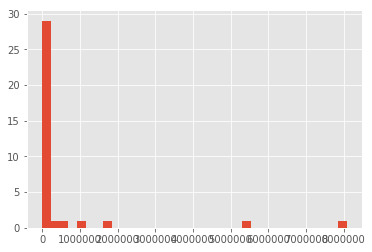

In [13]:
hist(average_length_allrank[0][0],bins = 35)

#### 检查length和counts的的数量一样吗

In [49]:
np.sum(average_length_allrank[0],axis=1)

array([1.75453696e+07, 1.51443756e+07, 5.36272951e+05, 1.06174426e+04,
       8.04809902e+05, 3.10810984e+04, 2.00719902e+05, 5.23670492e+03,
       3.89946131e+05, 2.35881152e+06, 1.06065459e+05])

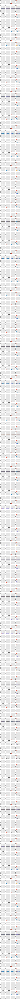

In [14]:
numss =216
fig,ax = plt.subplots(numss,4,figsize = (16,numss*4))
for i in range(numss):
    for j in range(4):
        ax[i,j].plot(average_length_allrank[i*4+j].T)

In [ ]:
plot_3d(35,11,average_length_allrank[0],azim=50,elev=20)

In [97]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np


def plot_3d(count_,num,lengthdat,azim=50,elev=20):
    '''
    count_ 长度种类  num rna数量
    '''
    fig = plt.figure(figsize=(20,10))
    ax1 = fig.gca(projection="3d")

    xpos = np.repeat(np.arange(1,count_+1),num).reshape(count_,-1).T.ravel()
    ypos = np.repeat(range(num),count_).ravel()
    num_elements = len(xpos)
    zpos = np.zeros(count_*num)
    dx = np.ones(count_*num)/5
    dy = np.ones(count_*num)/5
    dz = lengthdat.ravel()

    for i in range(num):
        ax1.bar3d(xpos[count_*i:count_*(i+1)], ypos[count_*i:count_*(i+1)], zpos[count_*i:count_*(i+1)],
                  dx[count_*i:count_*(i+1)], dy[count_*i:count_*(i+1)],dz[count_*i:count_*(i+1)], color=(np.array(tableau20)/float(256))[:num][i],alpha=0.9)
    plt.xticks(range(count_), [str(i+15) for i in range(count_)], color='red')
    #for i in range(9):
    ax1.set_yticks(range(num))
    ax1.set_yticklabels(rnanames[1:], color='blue')
    for color,tick in zip((np.array(tableau20)/float(256))[:num],ax1.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    ax1.view_init(azim=azim,elev=elev)  # 50 20
    ax1.set_title('Reads Length Distribution',fontsize=30)
    #ax1.bar3d(xpos[3:], ypos[3:], zpos[3:], dx[3:], dy[3:], dz[3:], color='b')
    #print ('azim: '+str(azim))
    plt.show()

#### specific region

In [94]:
def get_length_info_pie(lengthrange,lengthdat):
    lenrange = lengthrange-15
    return np.around(np.sum(lengthdat.T[lenrange],axis=0),decimals=2)

In [95]:
average_length_allrank[0].shape

(11, 35)

In [102]:
import plotly.plotly as py
import plotly.graph_objs as go

labels = rnanames[1:]
values = get_length_info_pie(np.arange(28,32),average_length_allrank[0])
colors = tableau20[:11]

trace = go.Pie(labels=labels, values=values,
               hoverinfo='label+percent', textinfo='value', 
               textfont=dict(size=13),
               marker=dict(colors=colors, 
                           line=dict(color='#000000', width=2)))

py.iplot([trace], filename='styled_pie_chart')

PlotlyRequestError: HTTPSConnectionPool(host='plot.ly', port=443): Max retries exceeded with url: /clientresp (Caused by NewConnectionError('<urllib3.connection.VerifiedHTTPSConnection object at 0x2ae792e99b90>: Failed to establish a new connection: [Errno 101] Network is unreachable',))

In [182]:
table1 = pd.read_table('/Share/home/caojingyi/exRNA/process/17.summary/00.summary/all_type.len')

In [140]:
table1.iloc[:,1:].shape

(35, 10)

In [143]:
table1.columns[1:]

Index([u'hg38', u'miRNA', u'piRNA', u'Y_RNA', u'snRNA', u'srpRNA', u'tRNA',
       u'lncRNA', u'mRNA', u'snoRNA'],
      dtype='object')

In [141]:
average_length_allrank[0].shape

(11, 35)

In [ ]:
plot_3d(35,11,average_length_allrank[0],azim=50,elev=20)

In [208]:
def plot_3d_(count_,num,lengthdat,azim=50,elev=20): 
    fig = plt.figure(figsize=(20,10))
    ax1 = fig.gca(projection="3d")

    xpos = np.repeat(np.arange(1,count_+1),num).reshape(count_,-1).T.ravel()
    ypos = np.repeat(range(num),count_).ravel()
    num_elements = len(xpos)
    zpos = np.zeros(count_*num)
    dx = np.ones(count_*num)/5
    dy = np.ones(count_*num)/5
    dz = lengthdat.ravel()

    for i in range(num):
        ax1.bar3d(xpos[count_*i:count_*(i+1)], ypos[count_*i:count_*(i+1)], zpos[count_*i:count_*(i+1)],
                  dx[count_*i:count_*(i+1)], dy[count_*i:count_*(i+1)],dz[count_*i:count_*(i+1)], color=(np.array(tableau20)/float(256))[:num][i],alpha=0.9)
    plt.xticks(range(count_), [str(i+15) for i in range(count_)], color='red')
    #for i in range(9):
    ax1.set_yticks(range(num))
    ax1.set_yticklabels([u'hg38', u'miRNA', u'piRNA', u'Y_RNA', u'snRNA', u'srpRNA', u'tRNA',
       u'lncRNA', u'mRNA', u'snoRNA'][::-1], color='blue')
    for color,tick in zip((np.array(tableau20)/float(256))[:num],ax1.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    ax1.view_init(azim=azim,elev=elev)  # 50 20
    ax1.set_title('Reads Length Distribution',fontsize=30)
    #ax1.bar3d(xpos[3:], ypos[3:], zpos[3:], dx[3:], dy[3:], dz[3:], color='b')
    #print ('azim: '+str(azim))
    plt.show()
    #png, pdf, ps, eps and svg
    for i in ['png', 'pdf', 'ps', 'eps','svg']:
        fig.savefig('images/lengthdistribution.'+i,format=i)

In [59]:
np.array(pd.read_table('/Share/home/caojingyi/exRNA/process/16.one_map/02.hg38/10515058-A.hg38.summary_new',
                       names=['0','1'])['1']).reshape(11,-1)#[np.array([0,1,2,3,4,5,7,9,10])]

array([[   41314,    48210,   159646,   218378,   822020,  4348394,
         4351791,  1524465,   384850,    83496,   169548,   189002,
          176097,   295930,   281102,  5554726, 10568791,   683095,
           99647,    63133,   107775,    86718,    39199,    33730,
           38385,    28657,    27020,    43869,    48786,    38641,
           19894,    85012,        0,    27304,  2892266],
       [     803,     9842,    21208,    48227,   119163,   681662,
         1704004,   457637,   135216,    16641,     3811,      721,
             228,       49,       51,       66,       33,       43,
              38,       59,       56,       60,       37,       29,
             237,      415,      499,      432,      200,      384,
             162,       45,        0,      555,     8807],
       [    4330,     7809,     8542,     5380,     4787,     5952,
            5829,     4549,     3693,     3289,     2598,     2965,
            5116,     4628,     3015,     3756,     2307,     3131

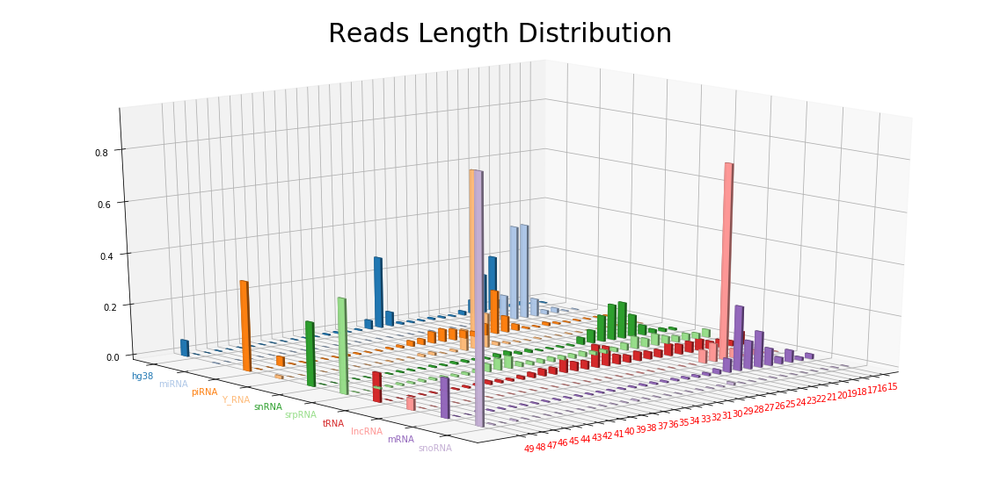

In [186]:
plot_3d_(35,10,get_ratio(table1),azim=50,elev=20)

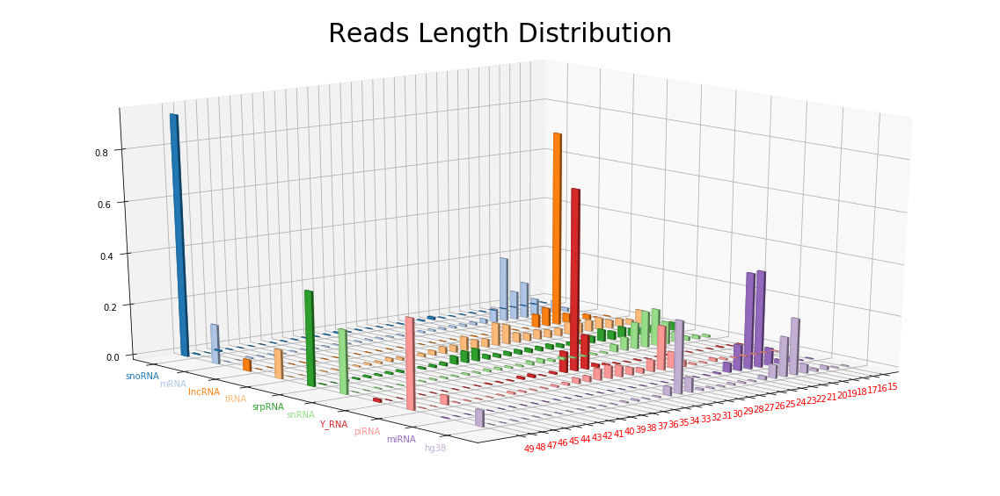

In [209]:
plot_3d_(35,10,np.flipud(get_ratio(table1)),azim=50,elev=20)

In [183]:
def get_ratio(table):
    tmp = np.array(table.iloc[:,1:]).T
    average = np.ndarray([tmp.shape[0],tmp.shape[1]])
    for i in range(tmp.shape[0]):
        average[i] = tmp[i] / float(np.sum(tmp[i]))
    return average

In [185]:
np.sum(get_ratio(table1),axis=1)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

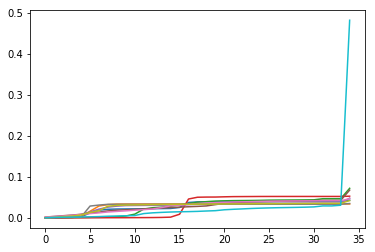

In [176]:
plt.plot(get_average(table1).T)

In [174]:
np.sum(get_average(table1),axis=1)

array([1.00000000e+00, 4.56981834e-01, 1.56084066e-02, 3.23520200e-01,
       1.03778262e-03, 1.16569781e-04, 1.28795157e-03, 1.24048609e-01,
       9.17247063e-03, 2.04535248e-03])

### debug

In [215]:
# 重新验证脚本所得到的结果与一列一列找的结果是否一致
wholesamplelengtharr.shape

(61, 864, 11, 35)

In [4]:
originalnames = np.array(['length','lncRNA', 'miRNA', 'mRNA', 'piRNA', 'snoRNA', 'snRNA', 'srpRNA',
       'tRNA', 'vaultRNA', 'Y_RNA', 'tucpRNA'])
rnanames = np.array(['length', 'miRNA', 
            'Y_RNA', 'piRNA', 'srpRNA', 
            'snoRNA', 'snRNA', 'tRNA','vaultRNA',
            'tucpRNA', 'lncRNA','mRNA' ])
xsorted = np.argsort(originalnames)
ypos = np.searchsorted(originalnames[xsorted], rnanames)
transind  = xsorted[ypos]
wholenum = np.math.factorial(1)*np.math.factorial(3)*np.math.factorial(4)*np.math.factorial(3)

rankin1 = np.array(list(itertools.permutations(np.arange(0,3))))
rankin2 = np.array(list(itertools.permutations(np.arange(0,4))))
rankin3 = np.array(list(itertools.permutations(np.arange(0,3))))
rankind = np.zeros([wholenum,10]).astype('int')

In [ ]:
for i in range(6):
    for j in range(24):
        for t in range(6):
            rankind[i*144+j*6+t] =\
            np.concatenate((rankin1[i],rankin2[j],rankin3[t]))

lengthind = np.array([16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26., 27., 28.,
       29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39., 40., 41.,
       42., 43., 44., 45., 46., 47., 48.,49., 50.]).astype('int')

filename = np.loadtxt('lengthfilename.txt'
                      ,dtype='str')[0]  
samplearrmx = np.array(pd.read_table(filename)
                       .iloc[:,:])[:,transind][:]

In [6]:
samplearrmx

array([[49.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  3.,  0.],
       [30.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  3.,  3.],
       [31.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  3.,  4.],
       [21.,  4.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  4.,  0.],
       [30.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  3.,  3.],
       [21.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  3.,  0.],
       [18.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.],
       [30.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  4.,  3.],
       [21.,  2.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  5.,  0.],
       [32.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  3.,  3.]])

In [ ]:
# 30 31 30 30 32

In [23]:
adjustarr[0]

array([[0., 0., 1., 0., 0., 3., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 3., 1.,
        1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0.

In [ ]:
##countafter非常重要！一个一星期没搞明白的bug就是因为没有加countafter！ 这次提前把各种group的length提前存了

In [30]:
mirnacountafter = np.where(samplearrmx[:,1]==0) 
mirnacountneed = np.where(samplearrmx[:,1]!=0) 
countind1,counts1 =np.unique(samplearrmx[mirnacountneed,0],return_counts=True)
countind1 = countind1.astype('int')
positionind = np.where(np.in1d(lengthind,countind1))
mirnalength= np.zeros([35])
print (counts1.shape)
print (positionind[0].shape)
mirnalength[positionind] = counts1


group1needarr = samplearrmx[mirnacountafter[0]][:,2:5]#np.concatenate((np.array([0]),np.arange(2,5)))]
group1countafter = np.where(np.sum(group1needarr,axis=1)==0)
group1needind = np.where(np.sum(group1needarr,axis=1)!=0)
group1needarr = group1needarr[group1needind]
lengthgroup1 = samplearrmx[:,0][mirnacountafter[0]][group1needind]

group2needarr = samplearrmx[mirnacountafter[0]][group1countafter][:,5:9]#np.concatenate((np.array([0]),np.arange(5,9)))]
group2countafter = np.where(np.sum(group2needarr,axis=1)==0)
group2needind = np.where(np.sum(group2needarr,axis=1)!=0)
group2needarr = group2needarr[group2needind]
lengthgroup2 = samplearrmx[:,0][mirnacountafter[0]][group1countafter[0]][group2needind]

group3needarr = samplearrmx[mirnacountafter[0]][group1countafter][group2countafter][:,9:12]#np.concatenate((np.array([0]),np.arange(9,12)))]
group3needind = np.where(np.sum(group3needarr,axis=1)!=0)
group3needarr = group3needarr[group3needind]
lengthgroup3 = samplearrmx[:,0][mirnacountafter[0]][group1countafter[0]][group2countafter[0]][group3needind]



def get_single_column_length(lengthgroup,groupneedarr,i,rank):
    groupcol = (groupneedarr[:,rank] !=0).argmax(axis=1)
    groupcountind = np.unique( lengthgroup[np.where(groupcol ==i)],return_counts=True)
    groupcountind_ = groupcountind[0].astype('int')
    returnlength = np.zeros([35])
    for i in range(35):
        returnlength[i] = groupcountind[1][np.where(groupcountind_ ==(i+16))] if np.where(groupcountind_ ==(i+16))[0].shape[0]!=0 else 0
    #positionind = np.where(np.in1d(lengthind,groupcountind_))[0]
    #returnlength = np.zeros([35])
    #returnlength[positionind] = groupcountind[1]
    return returnlength

print (group1needarr.shape,group2needarr.shape,group3needarr.shape)

counts1 = np.ndarray([6,3,35]).astype('int')
for i in range(6):
    group1countlength1 = get_single_column_length(lengthgroup1,group1needarr,0,rankin1[i])
    group1countlength2 = get_single_column_length(lengthgroup1,group1needarr,1,rankin1[i])
    group1countlength3 = get_single_column_length(lengthgroup1,group1needarr,2,rankin1[i])
    counts1[i] = np.concatenate((group1countlength1,group1countlength2
                               ,group1countlength3)).reshape(3,-1)

counts2 = np.ndarray([24,4,35]).astype('int')
for i in range(24):
    group2countlength1 = get_single_column_length(lengthgroup2,group2needarr,0,rankin2[i])
    group2countlength2 = get_single_column_length(lengthgroup2,group2needarr,1,rankin2[i])
    group2countlength3 = get_single_column_length(lengthgroup2,group2needarr,2,rankin2[i])
    group2countlength4 = get_single_column_length(lengthgroup2,group2needarr,3,rankin2[i])
    counts2[i] = np.concatenate((group2countlength1,group2countlength2
                               ,group2countlength3,group2countlength4)).reshape(4,-1)
counts3 = np.ndarray([6,3,35]).astype('int')
for i in range(6):
    group3countlength1 = get_single_column_length(lengthgroup3,group3needarr,0,rankin3[i])
    group3countlength2 = get_single_column_length(lengthgroup3,group3needarr,1,rankin3[i])
    group3countlength3 = get_single_column_length(lengthgroup3,group3needarr,2,rankin3[i])
    counts3[i] = np.concatenate((group3countlength1,group3countlength2
                               ,group3countlength3)).reshape(3,-1)

wholecounts = np.zeros([864,11,35]).astype('int')

for i in range(6):
    for j in range(24):
        for t in range(6):
            wholecounts[i*144+j*6+t] =\
            np.concatenate((mirnalength.reshape(1,-1),counts1[i],counts2[j],counts3[t]),axis=0)


print ('whole array dim: ')
print (wholecounts.shape)

def get_rnanameind():
    wholenum = 864
    rankin1 = np.array(list(itertools.permutations(np.arange(1,4))))
    rankin2 = np.array(list(itertools.permutations(np.arange(4,8))))
    rankin3 = np.array(list(itertools.permutations(np.arange(8,11))))
    rankind = np.zeros([wholenum,11]).astype('int')
    for i in range(6):
        for j in range(24):
            for t in range(6):
                rankind[i*144+j*6+t,1:] =\
                np.concatenate((rankin1[i],rankin2[j],rankin3[t]))
    return rankind
adjustarr = np.zeros([864,11,35])
for i in range(864):
    adjustarr[i] = wholecounts[i,get_rnanameind()[i]]

(2,)
(2,)
((5, 3), (1, 4), (0, 3))
whole array dim: 
(864, 11, 35)


In [91]:
originalnames = np.array(['lncRNA', 'miRNA', 'mRNA', 'piRNA', 'snoRNA', 'snRNA', 'srpRNA',
       'tRNA', 'vaultRNA', 'Y_RNA', 'tucpRNA'])
rnanames = np.array([ 'miRNA', 
            'Y_RNA', 'piRNA', 'srpRNA', 
            'snoRNA', 'snRNA', 'tRNA','vaultRNA',
            'tucpRNA', 'lncRNA','mRNA' ])
xsorted = np.argsort(originalnames)
ypos = np.searchsorted(originalnames[xsorted], rnanames)
transind  = xsorted[ypos]
wholenum = np.math.factorial(1)*np.math.factorial(3)*np.math.factorial(4)*np.math.factorial(3)

rankin1 = np.array(list(itertools.permutations(np.arange(0,3))))
rankin2 = np.array(list(itertools.permutations(np.arange(0,4))))
rankin3 = np.array(list(itertools.permutations(np.arange(0,3))))
rankind = np.zeros([wholenum,10]).astype('int')
for i in range(6):
    for j in range(24):
        for t in range(6):
            rankind[i*144+j*6+t] =\
            np.concatenate((rankin1[i],rankin2[j],rankin3[t]))


filename = np.loadtxt('filename.txt',dtype='str')[0]  #'17402567-B.all.mx'
samplearrmx = np.array(pd.read_table(filename)
                       .iloc[:,1:])[:,transind]


In [81]:
def get_rnanameind():
    wholenum = 864
    rankin1 = np.array(list(itertools.permutations(np.arange(1,4))))
    rankin2 = np.array(list(itertools.permutations(np.arange(4,8))))
    rankin3 = np.array(list(itertools.permutations(np.arange(8,11))))
    rankind = np.zeros([wholenum,11]).astype('int')
    for i in range(6):
        for j in range(24):
            for t in range(6):
                rankind[i*144+j*6+t,1:] =\
                np.concatenate((rankin1[i],rankin2[j],rankin3[t]))
    return rankind
rankind_ = get_rnanameind()

In [82]:
rankind_[0]

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

In [128]:
counts1

array([[17528031,   587849,     9689],
       [17528031,    10474,   587064],
       [  614717, 17501163,     9689],
       [  614717,     9692, 17501160],
       [   10477, 17528028,   587064],
       [   10477,   613932, 17501160]])

In [103]:
np.unique(( group1needarr[:,rankin1[5]] !=0).argmax(axis=1),return_counts=True)

(array([0, 1, 2]), array([   10477,   613932, 17501160]))

In [111]:
get_rnanameind()[144*4]

array([ 0,  3,  1,  2,  4,  5,  6,  7,  8,  9, 10])

In [136]:
for i in range(6):
    print rnanames[1:4]
    print counts1[i]

['Y_RNA' 'piRNA' 'srpRNA']
[17528031   587849     9689]
['Y_RNA' 'piRNA' 'srpRNA']
[17528031    10474   587064]
['Y_RNA' 'piRNA' 'srpRNA']
[  614717 17501163     9689]
['Y_RNA' 'piRNA' 'srpRNA']
[  614717     9692 17501160]
['Y_RNA' 'piRNA' 'srpRNA']
[   10477 17528028   587064]
['Y_RNA' 'piRNA' 'srpRNA']
[   10477   613932 17501160]


In [144]:
rankin1

array([[0, 1, 2],
       [0, 2, 1],
       [1, 0, 2],
       [1, 2, 0],
       [2, 0, 1],
       [2, 1, 0]])

### 提取顺序有误

In [147]:
rankin1

array([[0, 1, 2],
       [0, 2, 1],
       [1, 0, 2],
       [1, 2, 0],
       [2, 0, 1],
       [2, 1, 0]])

In [158]:
get_rnanameind().shape

(864, 11)

In [164]:
transindtest[144*4]

array([ 0,  2,  3,  1,  4,  5,  6,  7,  8,  9, 10])

In [153]:
transindtest

array([[0., 1., 2.],
       [0., 2., 1.],
       [1., 0., 2.],
       [2., 0., 1.],
       [1., 2., 0.],
       [2., 1., 0.]])

In [145]:
for i in range(6):
    print rnanames[1:4]
    print counts1[i]

['Y_RNA' 'piRNA' 'srpRNA']
[17528031   587849     9689]
['Y_RNA' 'piRNA' 'srpRNA']
[17528031    10474   587064]
['Y_RNA' 'piRNA' 'srpRNA']
[  614717 17501163     9689]
['Y_RNA' 'piRNA' 'srpRNA']
[  614717     9692 17501160]
['Y_RNA' 'piRNA' 'srpRNA']
[   10477 17528028   587064]
['Y_RNA' 'piRNA' 'srpRNA']
[   10477   613932 17501160]


In [143]:
for i in range(6):
    print rnanames[1:4]
    print counts1[i][rankin1[i]]

['Y_RNA' 'piRNA' 'srpRNA']
[17528031   587849     9689]
['Y_RNA' 'piRNA' 'srpRNA']
[17528031   587064    10474]
['Y_RNA' 'piRNA' 'srpRNA']
[17501163   614717     9689]
['Y_RNA' 'piRNA' 'srpRNA']
[    9692 17501160   614717]
['Y_RNA' 'piRNA' 'srpRNA']
[  587064    10477 17528028]
['Y_RNA' 'piRNA' 'srpRNA']
[17501160   613932    10477]


In [156]:
for i in range(6):
    print rnanames[1:4]
    print counts1[i][transindtest[i]]

['Y_RNA' 'piRNA' 'srpRNA']
[17528031   587849     9689]
['Y_RNA' 'piRNA' 'srpRNA']
[17528031   587064    10474]
['Y_RNA' 'piRNA' 'srpRNA']
[17501163   614717     9689]
['Y_RNA' 'piRNA' 'srpRNA']
[17501160   614717     9692]
['Y_RNA' 'piRNA' 'srpRNA']
[17528028   587064    10477]
['Y_RNA' 'piRNA' 'srpRNA']
[17501160   613932    10477]


In [134]:
for i in range(6):
    print rnanames[1:4][rankin1[i]]
    print counts1[i]

['Y_RNA' 'piRNA' 'srpRNA']
[17528031   587849     9689]
['Y_RNA' 'srpRNA' 'piRNA']
[17528031    10474   587064]
['piRNA' 'Y_RNA' 'srpRNA']
[  614717 17501163     9689]
['piRNA' 'srpRNA' 'Y_RNA']
[  614717     9692 17501160]
['srpRNA' 'Y_RNA' 'piRNA']
[   10477 17528028   587064]
['srpRNA' 'piRNA' 'Y_RNA']
[   10477   613932 17501160]


In [96]:
samplearrmx[:,rankind_[300]]

array([[0., 0., 0., ..., 0., 3., 0.],
       [0., 0., 2., ..., 0., 3., 3.],
       [0., 0., 1., ..., 0., 3., 4.],
       ...,
       [0., 0., 2., ..., 0., 3., 3.],
       [0., 0., 2., ..., 0., 3., 3.],
       [0., 0., 2., ..., 0., 3., 3.]])

In [89]:
wholecounts[300]

array([4, 0, 5, 0, 1, 0, 0, 0, 0, 0, 0])

In [92]:


mirnacountafter = np.where(samplearrmx[:,0]==0)  #filter after mirna
mirnacount = samplearrmx.shape[0] - mirnacountafter[0].shape[0]

group1needarr = samplearrmx[mirnacountafter[0]][:,1:4]
group1countafter = np.where(np.sum(group1needarr,axis=1)==0)
group1needind = np.where(np.sum(group1needarr,axis=1)!=0)
group1needarr = group1needarr[group1needind]

group2needarr = samplearrmx[mirnacountafter[0]][group1countafter][:,4:8]
group2countafter = np.where(np.sum(group2needarr,axis=1)==0)
group2needind = np.where(np.sum(group2needarr,axis=1)!=0)
group2needarr = group2needarr[group2needind]

group3needarr = samplearrmx[mirnacountafter[0]][group1countafter][group2countafter][:,8:11]
group3needind = np.where(np.sum(group3needarr,axis=1)!=0)
group3needarr = group3needarr[group3needind]

print (group1needarr.shape,group2needarr.shape,group3needarr.shape)
counts1 = np.ndarray([6,3]).astype('int')
for i in range(6):
    uniind1 = np.unique(( group1needarr[:,rankin1[i]] !=0).argmax(axis=1),return_counts=True)
    counts1[i][uniind1[0]]= uniind1[1]
counts2 = np.ndarray([24,4]).astype('int')
for i in range(24):
    uniind2 = np.unique(( group2needarr[:,rankin2[i]] !=0).argmax(axis=1),return_counts=True)
    counts2[i][uniind2[0]]= uniind2[1]
counts3 = np.ndarray([6,3]).astype('int')
for i in range(6):
    uniind3 = np.unique(( group3needarr[:,rankin3[i]] !=0).argmax(axis=1),return_counts=True)
    counts3[i][uniind3[0]]= uniind3[1]       
    
wholecounts = np.zeros([wholenum,10]).astype('int')

for i in range(6):
    for j in range(24):
        for t in range(6):
            wholecounts[i*144+j*6+t,:] =\
            np.concatenate((counts1[i],counts2[j],counts3[t]))
wholecounts = np.concatenate((np.repeat(mirnacount,wholenum).reshape(-1,1),wholecounts),axis=1)

((18125569, 3), (2087362, 4), (3716264, 3))


In [104]:
wholecounts

array([[13849720, 17528031,   587849, ...,   424868,  3160776,   130620],
       [13849720, 17528031,   587849, ...,   424868,   476095,  2815301],
       [13849720, 17528031,   587849, ...,  3575693,     9951,   130620],
       ...,
       [13849720,    10477,   613932, ...,  3575693,   131575,     8996],
       [13849720,    10477,   613932, ...,   507035,   393928,  2815301],
       [13849720,    10477,   613932, ...,   507035,  3200233,     8996]])